# World Modelers PI meeting demo
Benjamin M. Gyori, Harvard Medical School, 7/29/2018

In [109]:
%matplotlib inline
import json
import numpy
import pandas
import matplotlib.pyplot as plt
from IPython.display import Image
plt.rcParams['font.size'] = 18
plt.rcParams['figure.figsize'] = [10, 8]
from collections import Counter
from pysb.simulator import ScipyOdeSimulator
def df_from_counter(c, idx): return pandas.DataFrame.from_dict(cnt, orient='index').reset_index().rename(columns={'index': idx, 0:'count'})

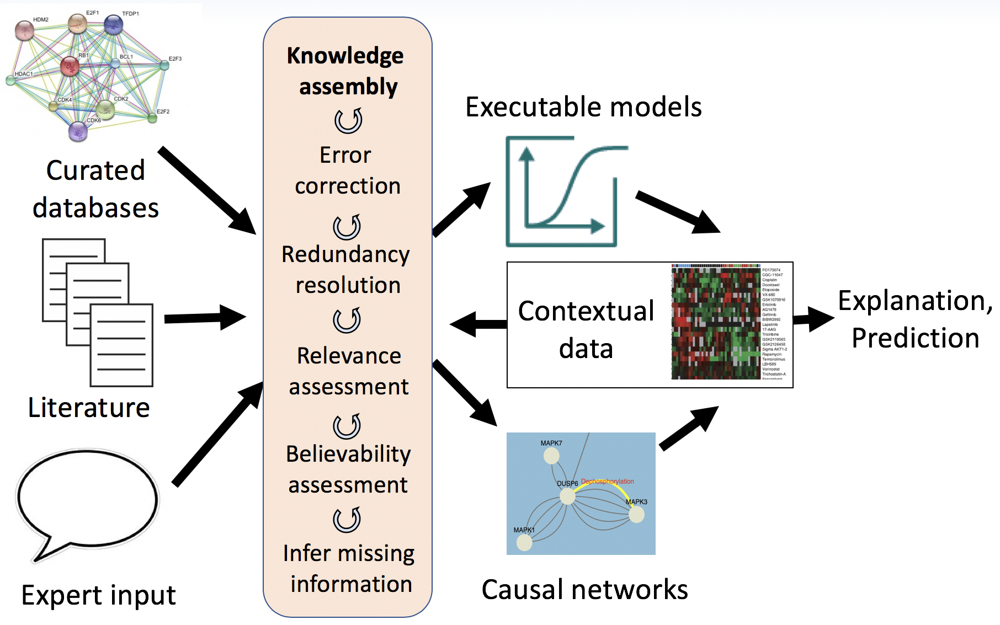

In [110]:
Image('demo/indra_concept_detailed.png')

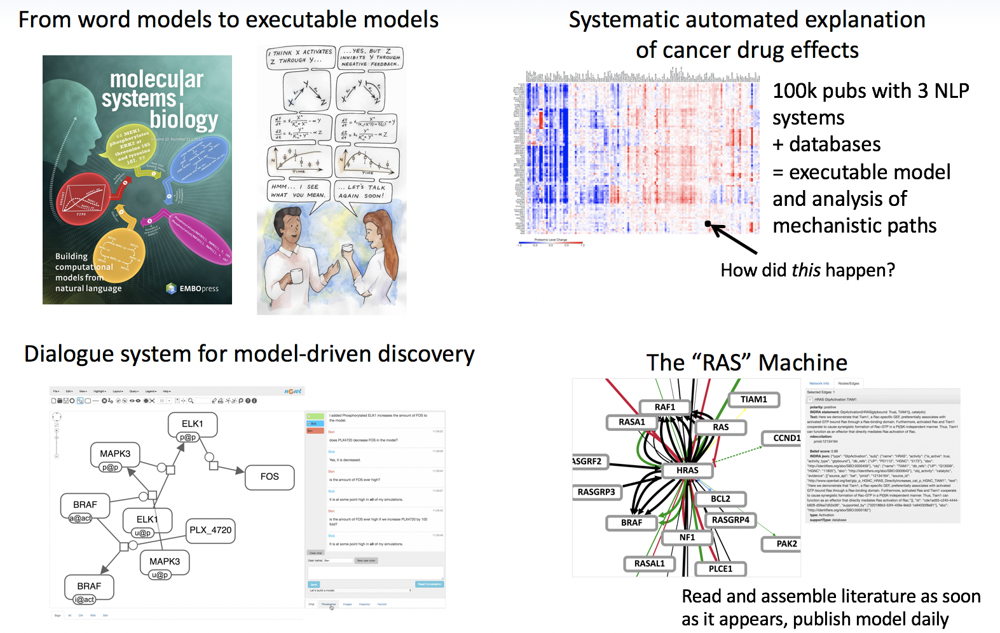

In [10]:
Image('demo/indra_apps.png')

### Import some INDRA modules

In [11]:
from indra.sources import eidos, hume, sofia, cwms
from indra.assemblers import GraphAssembler, CAGAssembler, PysbAssembler
from indra.statements import Influence, Concept

# Simple text-to-model assembly
We first look at a simple example to the text to model assembly pipeline. The use case here assumes an expert who aims to rapidly prototype a model based on assumptions they describe in English language.

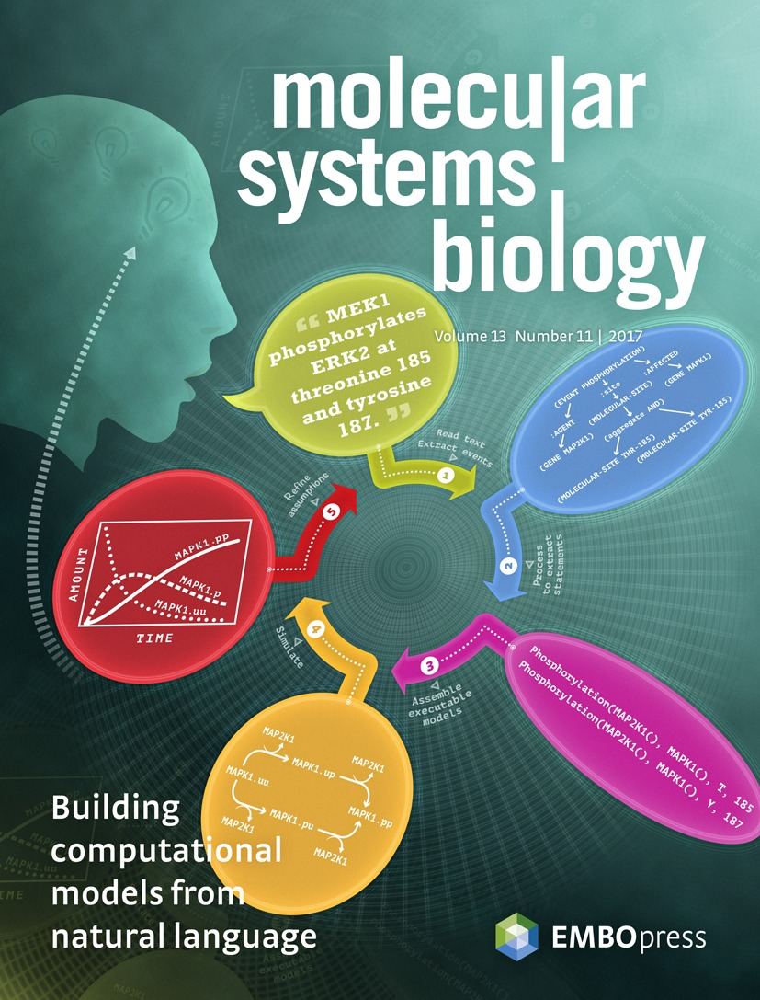

In [12]:
Image('demo/nl_modeling.jpg', retina=True)

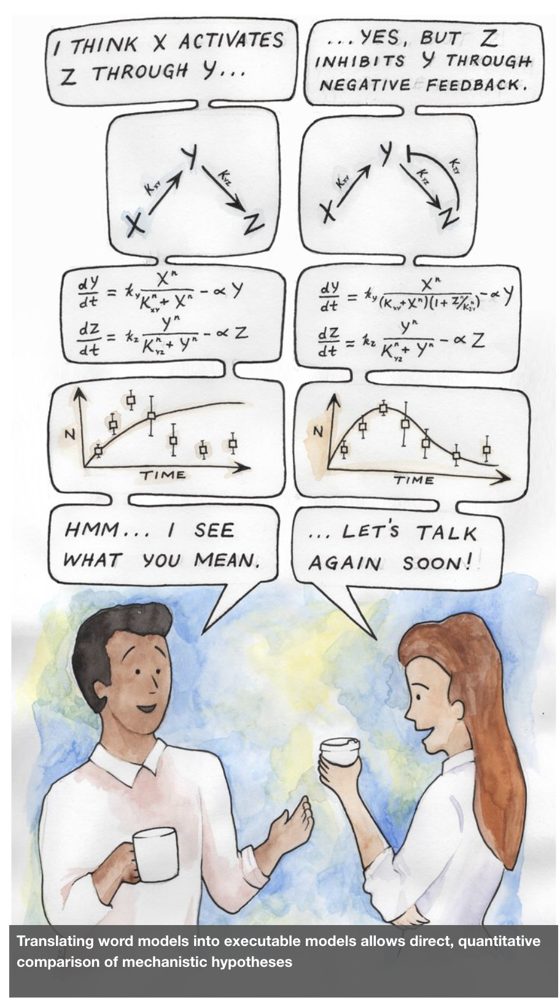

In [13]:
Image('demo/model_mouth.png', retina=True)

### Describe a model of food insecurity

In [111]:
text = """A significant increase in precipitation resulted in food insecurity and
a decrease in humanitarian interventions. Actually, food insecurity itself can
lead to conflict, and in turn, conflict can drive food insecurity.
Generally, humanitarian interventions reduce conflict."""

### Read with Eidos via API, process into INDRA Statements
### Eidos reading process
Courtesy: Becky Sharp, UA

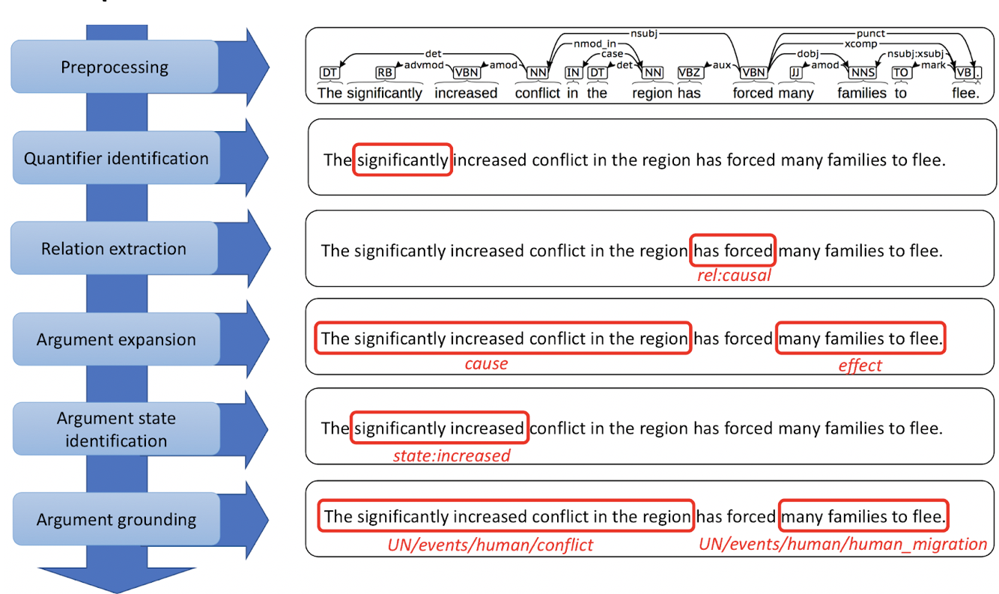

In [15]:
Image('demo/eidos.png')

In [112]:
eidos_processor = eidos.process_text(text, webservice='http://localhost:5000')
eidos_processor.statements

[Influence(conflict(), food insecurity()),
 Influence(precipitation(positive), humanitarian interventions(negative)),
 Influence(precipitation(positive), food insecurity()),
 Influence(food insecurity(), conflict()),
 Influence(humanitarian interventions(), conflict(negative))]

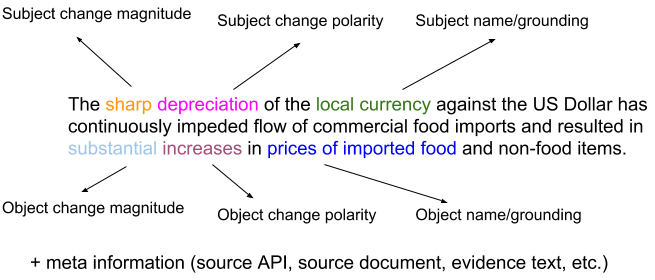

In [17]:
Image('demo/influence.png')

### Assemble into graph and draw

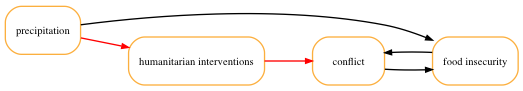

In [113]:
ga = GraphAssembler(eidos_processor.statements)
ga.make_model()
ga.save_pdf('text_to_model.png')
Image('text_to_model.png', width=800)

### Assemble into PySB/ODE model and simulate

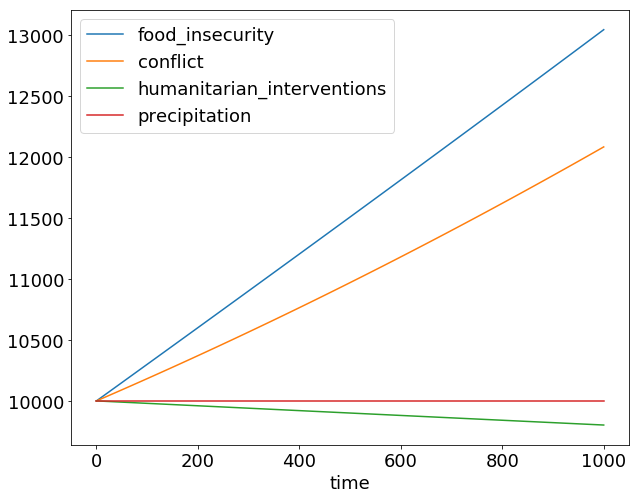

In [114]:
def assemble_pysb(stmts, reverse_effects=True):
    pa = PysbAssembler()
    pa.add_statements(stmts)
    model = pa.make_model(reverse_effects=reverse_effects)
    return model

def simulate_model(model, ts=None, pd=None):
    if not ts:
        ts = numpy.linspace(0, 1000, 100)
    sim = ScipyOdeSimulator(model, ts)
    if not pd:
        res = sim.run()
    else:
        res = sim.run(param_values=pd)
    df = res.dataframe
    df = df.rename(columns={'__s%d' % i: s.monomer_patterns[0].monomer.name
                            for i, s in enumerate(model.species)})
    return df

model = assemble_pysb(eidos_processor.statements, True)
df = simulate_model(model, ts=None, pd={'kf_f_deg_1': 1e-4})
df.plot()

### Now let's see what happens in whe increase humanitarian intervention and decrease precipitation
Both conflict and food insecturity now decrease.

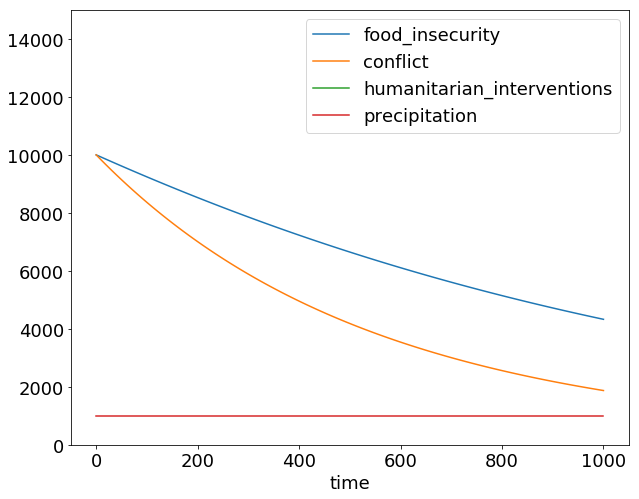

In [115]:
df = simulate_model(model, ts=None, pd={'humanitarian_interventions_0': 1e6, 'precipitation_0': 1e3,
                                        'kf_f_deg_1': 1e-3})
df.plot(ylim=[0, 15000])

### We can also modify the model simply by changing the text

In [116]:
text2 = text + ' Displacement causes food insecurity.'

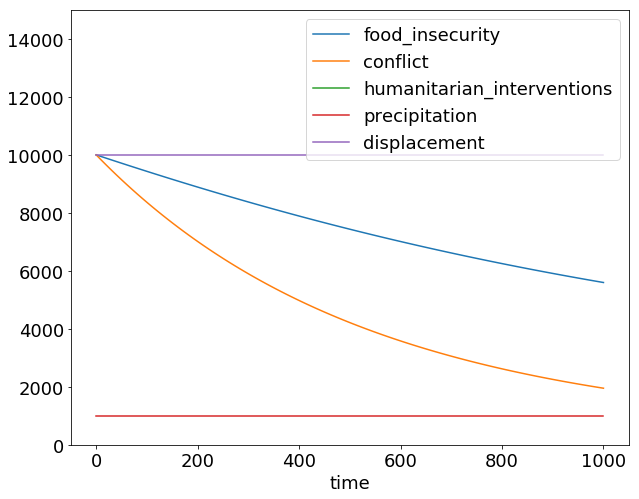

In [118]:
df = simulate_model(assemble_pysb(eidos.process_text(text2, webservice='http://localhost:5000').statements),
                    ts=None, pd={'humanitarian_interventions_0': 1e6, 'precipitation_0': 1e3,
                                 'kf_f_deg_1': 1e-3})
df.plot(ylim=[0, 15000])

# Reading, assembly and modeling of food insecurity in South Sudan

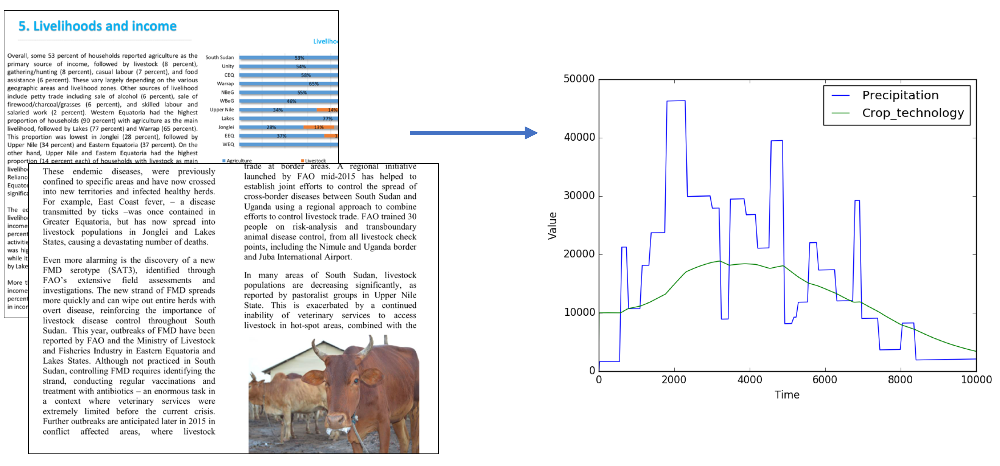

In [119]:
Image('demo/eval_doc_text_model.png')

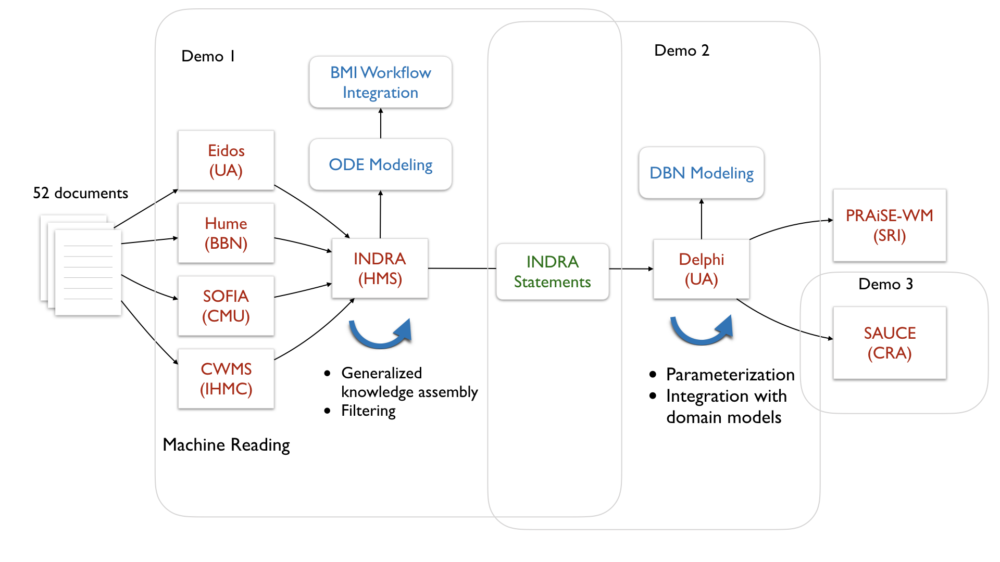

In [34]:
Image('demo/demo_arch_pimtg.png')

In [120]:
from run_eval import *

In [121]:
# Get the IDs of all the documents in the docs folder
docnames = sorted(['.'.join(os.path.basename(f).split('.')[:-1])
                   for f in glob.glob('docs/*.txt')],
                   key=lambda x: int(x.split('_')[0]))
exclude = '31_South_Sudan_2018_Humanitarian_Needs_Overview'
docnames = [d for d in docnames if d != exclude]
print('Using %d documents' % len(docnames))

Using 51 documents


On another note: indra.literature.elsevier_client and indra.literature.newsapi_client can be used to query for and collect reading corpora on demand (e.g. we collected Elsevier-published papers discussing "food security + intervention")

In [122]:
eidos_stmts = read_eidos(docnames)
cwms_stmts = read_cwms_sentences(extract_eidos_text(docnames), read=False)
hume_stmts = read_hume('bbn/wm_m6_0628.json-ld')
sofia_stmts = read_sofia('sofia/MITRE_June18_v1.xlsx')

6 stmts from 1_IPC_Alert_9_SouthSudan_Sept2017
93 stmts from 2_IFPRI
50 stmts from 3_ALPAN_Paper_10
4 stmts from 4_FAO
108 stmts from 5_annurev-publhealth-031816-044356
6 stmts from 6_FAO_news
0 stmts from 7_South_Sudan_KeyMessages_Sept2017
24 stmts from 8_EA_Seasonal Monitor_2017_08_11
26 stmts from 9_FAOSS Livestock Crisis Update 2015
151 stmts from 10_FAO_a-i5505e
114 stmts from 11_FAO_a-i5591e
8 stmts from 12_SSD21-February-2017
15 stmts from 13_SSD_8
13 stmts from 14_SSD09-May-2017
24 stmts from 15_FEWS NET South Sudan Famine Risk Alert_20170117
4 stmts from 16_South Sudan - Key Message Update_ Thu, 2018-01-25
25 stmts from 17_FS2011-3072
4 stmts from 18_FFP Fact Sheet_South Sudan_2018.01.17
2 stmts from 19_wfp284277
3 stmts from 20_wfp287168
98 stmts from 21_i8343en
20 stmts from 22_IPC_South_Sudan_AcuteFI_May2017_June-July2017
1 stmts from 23_ipc_south_sudan_key_messages_feb2017
29 stmts from 24_pnas.201409769
78 stmts from 25_2016_HNO_South Sudan
107 stmts from 26_South_Sudan_2

ERROR: [2018-07-30 09:57:14] indra/cwms - Could not parse XML string
ERROR: [2018-07-30 09:57:14] indra/cwms - Could not parse XML string
INFO: [2018-07-30 09:57:16] indra/hume - 911 relations of types causation, precondition, catalyst, mitigation, prevention found


We simply concatenate Statements from different sources - power of common knowledge representation!

In [123]:
statements = eidos_stmts + cwms_stmts + hume_stmts + sofia_stmts
print('%d total statements' % len(statements))

3172 total statements


Let's plot how many raw Statements we get from each source

<BarContainer object of 4 artists>

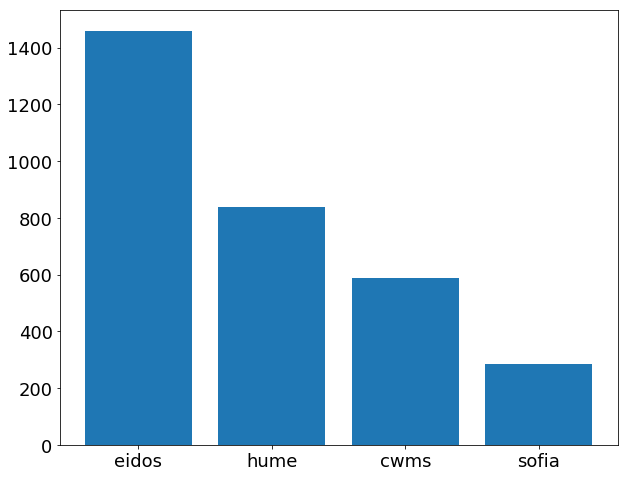

In [124]:
source_cnt = sorted(Counter([st.evidence[0].source_api for st in statements]).items(),
                    key=lambda x: x[1], reverse=True)
plt.bar(*zip(*source_cnt))

Statements can be inspected manually / programmatically, and also serve as an exchange format

In [125]:
eidos_stmts[0]

Influence(conflict(), livelihood(negative))

In [126]:
eidos_stmts[0].evidence[0].text

'WHY  Persistent insecurity and armed conflict have disrupted livelihood activities , affected market functionality and limited physical access to markets .'

In [127]:
eidos_stmts[0].subj.db_refs['UN']

[('UN/events/human/conflict', 0.8372545191211976),
 ('UN/events/human/intervention/intervention', 0.578830287706582),
 ('UN/entities/GPE', 0.5582304834451738),
 ('UN/entities/human/government/government_actions/regulation',
  0.5167213919557495),
 ('UN/events/crisis', 0.5124510124752975),
 ('UN/events/nature_impact/climate_change_mitigation', 0.5117896360536861),
 ('UN/events/human/human_migration', 0.5093050884962552),
 ('UN/entities/human/government/government_entity', 0.4985052191944197),
 ('UN/entities/human/government/government_actions/duty', 0.484892234234339),
 ('UN/entities/human/population', 0.48044607716068743)]

In [128]:
print(json.dumps(eidos_stmts[0].to_json(), indent=1))

{
 "type": "Influence",
 "subj": {
  "name": "conflict",
  "db_refs": {
   "TEXT": "armed conflict",
   "UN": [
    [
     "UN/events/human/conflict",
     0.8372545191211976
    ],
    [
     "UN/events/human/intervention/intervention",
     0.578830287706582
    ],
    [
     "UN/entities/GPE",
     0.5582304834451738
    ],
    [
     "UN/entities/human/government/government_actions/regulation",
     0.5167213919557495
    ],
    [
     "UN/events/crisis",
     0.5124510124752975
    ],
    [
     "UN/events/nature_impact/climate_change_mitigation",
     0.5117896360536861
    ],
    [
     "UN/events/human/human_migration",
     0.5093050884962552
    ],
    [
     "UN/entities/human/government/government_entity",
     0.4985052191944197
    ],
    [
     "UN/entities/human/government/government_actions/duty",
     0.484892234234339
    ],
    [
     "UN/entities/human/population",
     0.48044607716068743
    ]
   ],
   "WDI": [
    [
     "WDI/Presence_of_peace_keepers_(number_of

Let's now start assembly for real!
First, we map grounding between ontologies.

In [129]:
om = ontology_mapper.OntologyMapper(statements, ontology_mapper.wm_ontomap,
                                    symmetric=False, scored=True)
om.map_statements()
statements = om.statements

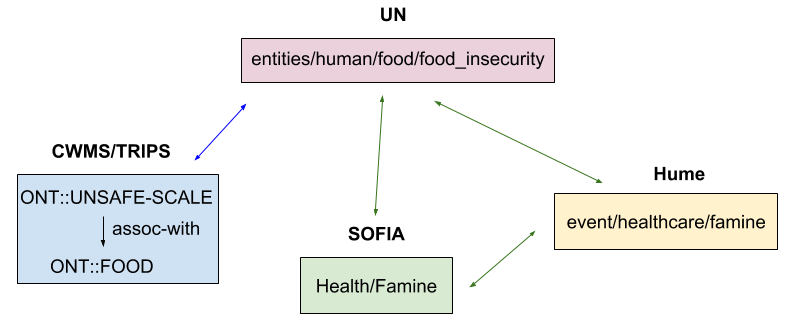

In [130]:
Image('demo/ontomap.png')

Let's look at a specific example

In [131]:
statements[261].subj.db_refs

{'CWMS': [('ONT::UNSAFE-SCALE|ONT::FOOD', 1.0)],
 'FAO': [('FAO/events/Value/Prevalence of severe food insecurity in the total population',
   0.7136202156818626),
  ('FAO/events/Value/Per capita food production variability (I$ per person constant 2004-06)',
   0.5980443219868409),
  ('FAO/events/Value/Number of severely food insecure people',
   0.5915045580547094),
  ('FAO/events/Value/Per capita food supply variability (kcal\\/capita\\/day)',
   0.5850729001861397),
  ('FAO/events/Yield\\/Carcass Weight/Meat, Poultry', 0.5745268362148006),
  ('FAO/events/Emissions intensity/Meat, chicken', 0.5718892276960331),
  ('FAO/events/Yield\\/Carcass Weight/Meat, cattle', 0.5619494705909741),
  ('FAO/events/Yield\\/Carcass Weight/Meat, chicken', 0.55498842249071),
  ('FAO/events/Food aid shipments/Non-Cereals', 0.549690556802688),
  ('FAO/events/Emissions intensity/Meat, cattle', 0.548090534021567)],
 'HUME': [('event/healthcare/famine', 0.7306410314328213)],
 'SOFIA': [('Health/Famine', 0.81

We see here that the original string "food security" is grounded to the UN, HUME, SOFIA and CWMS ontologies simultaneously.

We tabulate each Concept by the ontologies it is grounded to. This shows that the majority of Concepts are now grounded to multiple ontologies, with 2500+ grounded to at least 3 ontologies.

In [132]:
cnt = Counter([tuple(sorted(list(set(conc.db_refs.keys())-{'TEXT', 'FAO', 'WDI'})))
                             for stmt in statements for conc in stmt.agent_list()])
df_from_counter(cnt, 'Grounding')

,Grounding,count
0,"(CWMS, HUME, SOFIA, UN)",675
1,"(HUME, SOFIA, UN)",3793
2,"(UN,)",654
3,(),26
4,"(CWMS,)",1087
5,"(CWMS, UN)",91
6,"(HUME,)",18


Next, let's filter out Statements with unreliably grounded or ungrounded concepts

In [133]:
statements = ac.filter_grounded_only(statements, score_threshold=0.7)

INFO: [2018-07-30 10:00:20] indra/assemble_corpus - Filtering 3172 statements for grounded agents...
INFO: [2018-07-30 10:00:21] indra/assemble_corpus - 1786 statements after filter...


Now that we mapped ontologies, let's filter Statements by _relevance_ with respect ot a list of UN terms.

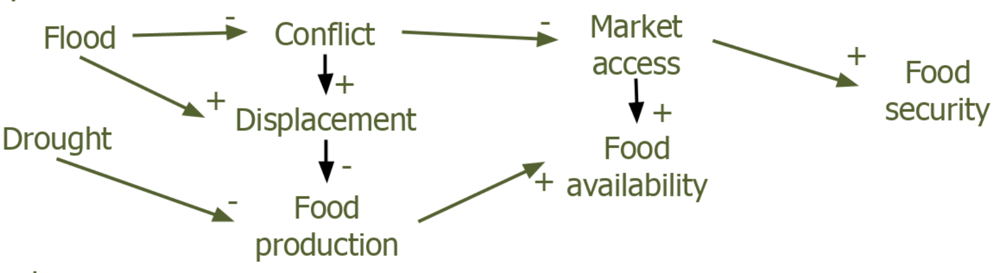

In [134]:
Image('demo/prior_model.png', retina=True)

In [135]:
statements = ac.filter_by_db_refs(statements, 'UN',
    ['conflict', 'food_security', 'food_insecurity', 'flooding', 'food_production',
     'human_migration', 'drought', 'food_availability', 'market',
     'precipitation'], policy='all',
    match_suffix=True)

INFO: [2018-07-30 10:01:11] indra/assemble_corpus - Filtering 1786 statements for those with all agents grounded to: conflict, food_security, food_insecurity, flooding, food_production, human_migration, drought, food_availability, market, precipitation in the UN namespace...
INFO: [2018-07-30 10:01:11] indra/assemble_corpus - 411 Statements after filter...


We make an assembly assumption in which we assume implicit positive polarity for influences where the _subject_ polarity is not explicit. We then filter out any remaining Statements that don't have both subject and object polarity set.

In [136]:
assume_polarity(statements)
statements = filter_has_polarity(statements)

225 statements after polarity filter


Next, we run "preasembly" on the set of Statements. We first construct a joint hierarchy of all the reader ontologies.

In [137]:
def get_joint_hierarchies():
    eidos_ont = os.path.join(os.path.abspath(eidos.__path__[0]),
                             'eidos_ontology.rdf')
    trips_ont = os.path.join(os.path.abspath(cwms.__path__[0]),
                             'trips_ontology.rdf')
    hume_ont = os.path.join(os.path.abspath(hume.__path__[0]),
                           'hume_ontology.rdf')
    hm = HierarchyManager(eidos_ont, True, True)
    hm.extend_with(trips_ont)
    hm.extend_with(hume_ont)
    hierarchies = {'entity': hm}
    return hierarchies
hierarchies = get_joint_hierarchies()

The code below is usually a one-liner but here we break it up into multiple parts to show exactly what happens.

In [138]:
# Combine duplicates with the Preassembler
pa = Preassembler(hierarchies, statements)
unique_stmts = pa.combine_duplicates()
print('%d unique statements' % len(unique_stmts))
# Run the BeliefEngine with prior probabilities
be = BeliefEngine()
be.set_prior_probs(unique_stmts)
# Combine hierarchically-related Statements with the Preassembler
related_stmts = pa.combine_related(return_toplevel=False)
# Propagate beliefs over the hierarchy graph
be.set_hierarchy_probs(related_stmts)

INFO: [2018-07-30 10:02:39] indra/preassembler - Preassembling Influence (91)


91 unique statements


We can now filter for belief if we want to and get only the top-level Statements in the hierarchy

In [139]:
#statements = ac.filter_belief(related_stmts, 0.8)
top_stmts = ac.filter_top_level(related_stmts)
print('%d top-level statements' % len(top_stmts))

INFO: [2018-07-30 10:02:50] indra/assemble_corpus - Filtering 91 statements for top-level...
INFO: [2018-07-30 10:02:50] indra/assemble_corpus - 80 statements after filter...


80 top-level statements


&uparrow; This set of Statements is the input to Demo 2

The sources of individual pieces of evidence that contribute to Statements overall:

In [140]:
render_stmt_graph(statements).draw('demo/stmt_graph.png', prog='dot')

In [141]:
cnt = Counter([ev.source_api for stmt in top_stmts for ev in stmt.evidence])
df_from_counter(cnt, 'Source')

,Source,count
0,eidos,74
1,hume,93
2,sofia,15
3,cwms,4


In [142]:
cnt = Counter([tuple(sorted(list({ev.source_api for ev in stmt.evidence}))) for stmt in top_stmts])
df_from_counter(cnt, 'Sources')

,Sources,count
0,"(eidos,)",48
1,"(eidos, hume)",5
2,"(hume, sofia)",4
3,"(hume,)",14
4,"(cwms, eidos, hume)",1
5,"(sofia,)",3
6,"(eidos, sofia)",2
7,"(eidos, hume, sofia)",1
8,"(cwms, hume)",2


Let's pick one Statement and look at its evidence sentences in detail

In [155]:
stmt = [s for s in top_stmts if 'conflict' in s.subj.db_refs['UN'][0][0] and 'migration' in s.obj.db_refs['UN'][0][0]][0]
print('======')
print('source: %s' % stmt.subj.db_refs['UN'][0][0])
print('target: %s' % stmt.obj.db_refs['UN'][0][0])
print('======')
for ev in sorted(stmt.evidence, key=lambda x: x.text):
    print('%s: %s' % (ev.source_api.upper(), ev.text))
    print('--')

source: UN/events/human/conflict
target: UN/events/human/human_migration
SOFIA: Additionally , recent clashes have reportedly led to the displacement of at least 25 000 civilians around Ibba , Maridi , Mundri East , Mundri West and Yambio counties in Western Equatoria State . 
--
HUME: Although the  dispute  within  the  Sudan  People’s  Liberation  Movement  (SPLM)  was  primarily  political,  spiraling  violence  quickly  led  the  SPLM  and  the  national  army  (SPLA)  to  split,  resulting  in  the  formation  of  the  SPLM/A  in  Opposition  (SPLA-IO).
--
HUME: Conflict  is  driving  new  displacement,  putting  additional  stress  on  available  wild  food  sources.
--
SOFIA: Conflict continues to drive large-scale displacement , and the majority of those fleeing the country are leaving Greater Equatoria for Uganda ( Figure 4 ) . 
--
HUME: Fighting has also  been intense in the Greater Equatoria region, causing record  numbers of South Sudanese people to flee to Uganda, where th

We can also find contradictions

In [144]:
standardize_names(top_stmts)
pa.stmts = top_stmts
contradictions = pa.find_contradicts()
for c1, c2 in contradictions:
    print('%s\n <-> %s\n' % (c1, c2))

Influence(Food availability(negative), Food availability(negative))
 <-> Influence(Food availability(positive), Food availability(negative))

Influence(Food availability(negative), Food availability(negative))
 <-> Influence(Food availability(positive), Food availability(negative))

Influence(Food availability(positive), Food availability(negative))
 <-> Influence(Food availability(positive), Food availability(positive))

Influence(Food availability(positive), Food availability(negative))
 <-> Influence(Food availability(positive), Food availability(positive))

Influence(Food availability(positive), Food insecurity(negative))
 <-> Influence(Food availability(positive), Food security(negative))

Influence(Food availability(negative), Food security(negative))
 <-> Influence(Food availability(positive), Food security(negative))

Influence(Food availability(positive), Food security(negative))
 <-> Influence(Food availability(positive), Food security(positive))

Influence(Market(negative), 

How can we decide between alternatives?
1. Often an "apparent" conflict is resolved by additional temporal or spatial context
2. We can decide based on relative belief
3. We can expose these to the user an let them decide
4. In some cases both can be left in the model and data can implicitly prioritize
5. We can generate ensembles of models that can account for both possibilities (weighted by belief support)

In [145]:
top_stmts = remove_contradicts(top_stmts, contradictions)

INFO: [2018-07-30 10:05:52] indra/assemble_corpus - Filtering 80 statements for 38 UUIDs...
INFO: [2018-07-30 10:05:52] indra/assemble_corpus - 50 statements after filter...


### Now let's move on to model assembly

In [146]:
model = assemble_pysb(top_stmts)

This model works and can be simulated but it's not parameterized! Demo 3 covered methods to automatically parameterize models via gradable adjectives and indicators.

In [147]:
res_df = simulate_model(model)

In [148]:
res_df[['Conflict', 'Food_insecurity', 'Food_production']]

,Conflict,Food_insecurity,Food_production
time,,,
0.000000,10000.000000,10000.000000,10000.000000
10.101010,8223.970178,10052.925638,10012.497243
20.202020,6770.038587,10103.014174,10025.650537
30.303030,5579.780744,10150.787503,10039.335379
40.404040,4605.422011,10196.672039,10053.450015
50.505051,3807.816621,10241.016932,10067.911098
60.606061,3154.942768,10284.107599,10082.650457
70.707071,2620.562228,10326.177768,10097.612232
80.808081,2183.183913,10367.418769,10112.750662


We can also use INDRA's explanation module and the ModelChecker to find paths that satisfy a given set of overall Influences (with polarities).

In [149]:
from indra.explanation.model_checker import PysbModelChecker
to_check = Influence(Concept('Conflict'), Concept('Food_insecurity'))
mc = PysbModelChecker(model, statements=[to_check])
mc.prune_influence_map()
paths = mc.check_model(max_paths=10)
paths[0][1]

INFO: [2018-07-30 10:06:43] indra/pysb_assembler - No monomer found corresponding to agent Food_insecurity
INFO: [2018-07-30 10:06:43] indra/model_checker - Generating influence map
INFO: [2018-07-30 10:06:43] indra/model_checker - Removing self loops
INFO: [2018-07-30 10:06:43] indra/model_checker - Removing self loop: ('Market_degrades_Market', 'Market_degrades_Market')
INFO: [2018-07-30 10:06:43] indra/model_checker - Removing self loop: ('Food_production_degrades_Food_production', 'Food_production_degrades_Food_production')
INFO: [2018-07-30 10:06:43] indra/model_checker - Removing self loop: ('Precipitation_degrades_Precipitation', 'Precipitation_degrades_Precipitation')
INFO: [2018-07-30 10:06:43] indra/model_checker - Get successorts of each node
INFO: [2018-07-30 10:06:43] indra/model_checker - Compare combinations of successors
INFO: [2018-07-30 10:06:43] indra/model_checker - Removing 44 edges from influence map
INFO: [2018-07-30 10:06:43] indra/model_checker - Checking stmt:


PathResult:
    path_found: True
    result_code: PATHS_FOUND
    path_metrics: 
        0: source_node: Conflict_produces_Food_insecurity, target_node: Food_insecurity__obs, polarity: 1, length: 1
        1: source_node: Conflict_produces_Market, target_node: Food_insecurity__obs, polarity: 1, length: 2
        2: source_node: Conflict_degrades_Food_availability, target_node: Food_insecurity__obs, polarity: 1, length: 2
        3: source_node: Conflict_degrades_Food_production, target_node: Food_insecurity__obs, polarity: 1, length: 2
        4: source_node: Conflict_produces_Human_migration, target_node: Food_insecurity__obs, polarity: 1, length: 3
        5: source_node: Conflict_degrades_Food_availability, target_node: Food_insecurity__obs, polarity: 1, length: 3
        6: source_node: Conflict_produces_Market, target_node: Food_insecurity__obs, polarity: 1, length: 3
        7: source_node: Conflict_produces_Food_insecurity, target_node: Food_insecurity__obs, polarity: 1, length

In [102]:
paths[0][1].paths[8]

(('Conflict_produces_Human_migration', 1),
 ('Human_migration_degrades_Food_availability', 1),
 ('Food_availability_degrades_Food_insecurity', -1),
 ('Food_insecurity__obs', 1))

&uparrow; this is a powerful explanation finding tool:

"in what ways could increased precipitation have resulted in reduced food security?"

but for now, we can use it for debugging, i.e. "do the ways in which Precipitation affects Food insecurity in the model make sense?". In a lot of the cases, clearly, no, and these are easily identifiable in a problem-driven way here (i.e. focus on problems in the model that matter).

Finally, let's look at an integrated simulation of the model with Topoflow in a relevant context.

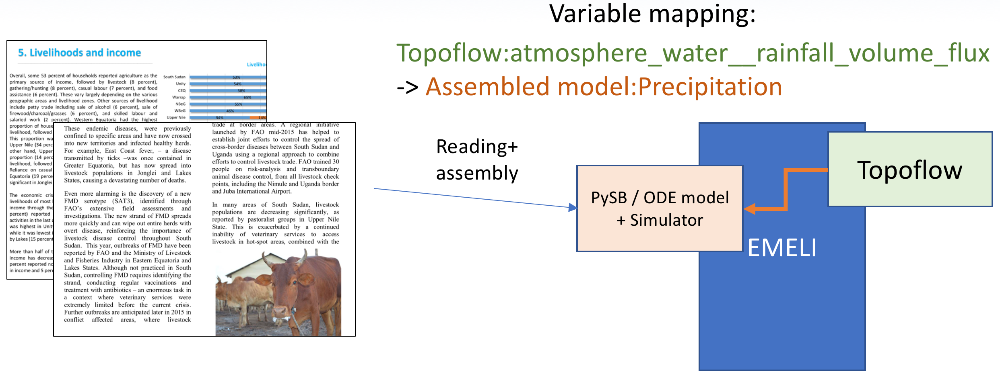

In [150]:
Image('demo/emeli_integ.png')

In [151]:
ac.dump_statements(top_stmts, 'indra_eval_stmts.pkl')

INFO: [2018-07-30 10:08:31] indra/assemble_corpus - Dumping 50 statements into indra_eval_stmts.pkl...


In [152]:
from indra.assemblers.bmi_wrapper import BMIModel
model.name = 'indra_eval_model'
bmi_model = BMIModel(model)
out_name_maps = {'atmosphere_water__rainfall_volume_flux':            
                 'Precipitation'}                                     
input_vars = ['Precipitation']
bm = BMIModel(model, inputs=input_vars, stop_time=10000,           
              outside_name_map=out_name_maps)
bmi_model.export_into_python()

Topoflow is configured with precipitation for the Gel-Aliab basin

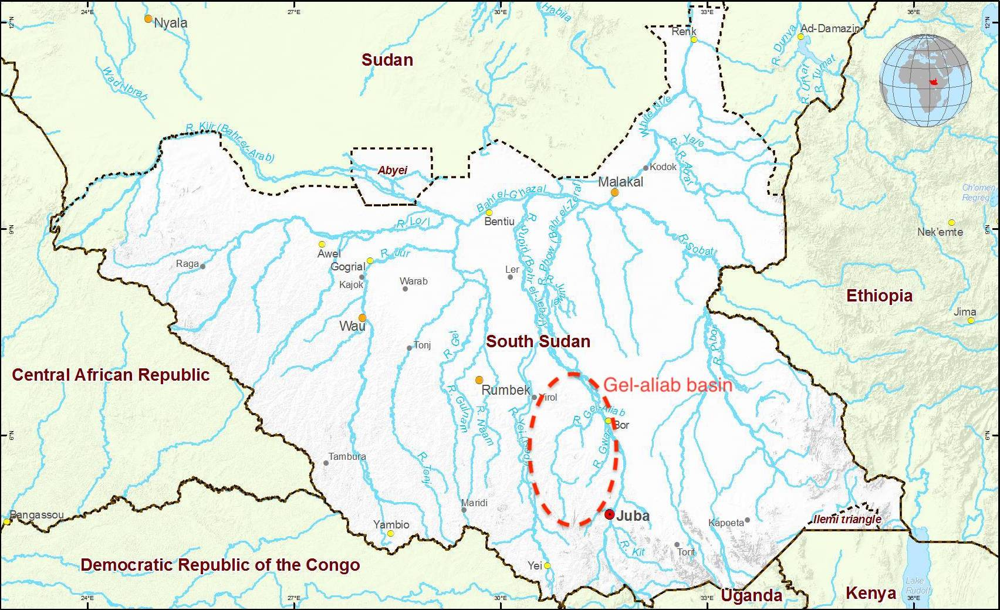

In [153]:
Image('demo/rivers.jpg', retina=True)

We now use this configuration of Topoflow and simulate it together with the model we just assembled.

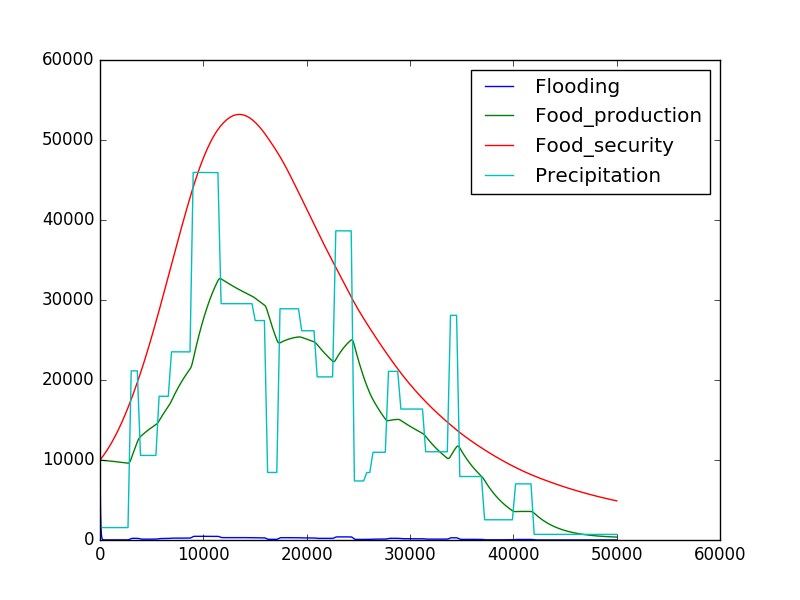

In [154]:
Image('demo/topoflow_simul2.png')